<h2>OBSERVATIONAL ASTROPHYSICS – FALL 2019 Reduction Exercise: Part 5</h2>

The goal of this part is to produce a color-magnitude diagram for your cluster.  Do do this we need to detect stars, measure their flux, compare it to a known magnitude for that star, derive the magnitude zeropoint for that band, and convert all of your fluxes to magnitudes.  This will be broked into the following steps:

1. read in image with a valid astrometric header (the output image from the end of part 4);
2. Locate stars in this image and measure their flux;
3. Read in an ASCII file with a list of measured magnitudes for stars in that cluster;
4. Cross-match the two lists to find which object corresponds to which;
5. Compare the fluxes and magnitudes to determine the magnitude zeropoint of your image, i.e. what magnitude is a single count;
6. Use this to create magnitudes in each band
7. Produce a color-magnitude diagrame

The first cell below is a routine designed to read in one image

In [1]:
import os, glob, time
import numpy as np
from astropy.io import fits
from matplotlib import pyplot as plt

redpath = "/home/b739c775/Documents/astro596/astr596_obsproject-master2/astr596_obsproject-master/Images/"
flatpath = "/home/b739c775/RFSLAB/USER_DPT/b739c775/ASTR596/Data/Flatcorrected/"
listpath = "/home/b739c775/RFSLAB/USER_DPT/b739c775/ASTR596/Data/ReducedData/"

A routine to display in image

In [2]:
def display_image(img, minclip=5, maxclip=95, label=None, cmap='Greys_r', 
                  srcs=None, projection=None, calibrated=False):
    """Simple wrapper to display an image.
    
    """
    from astropy.visualization import AsinhStretch as Stretch
    from astropy.visualization import ZScaleInterval as Interval
    from astropy.visualization.mpl_normalize import ImageNormalize

    #from astropy.visualization import simple_norm
    #norm = simple_norm(img, min_percent=minclip, max_percent=maxclip)

    interval = Interval(contrast=0.5)
    vmin, vmax = interval.get_limits(img)
    norm = ImageNormalize(interval=interval, stretch=Stretch(a=0.9))

    fig, ax = plt.subplots(figsize=(12, 12), subplot_kw={'projection': projection})
    im = ax.imshow(img, origin='lower', norm=norm, cmap=cmap,
                   vmin=vmin, vmax=vmax)
    if projection:
        ax.coords.grid(color='red')
        ax.coords['ra'].set_axislabel('Right Ascension')
        ax.coords['dec'].set_axislabel('Declination')      
    else:
        ax.set_xlabel('Column Number (pixels)')
        ax.set_ylabel('Row Number (pixels)')

    # Mark the locations of stars.
    if srcs:
        from photutils import CircularAperture
        pos = np.transpose((srcs['xcentroid'], srcs['ycentroid']))
        aps = CircularAperture(pos, r=12.)
        aps.plot(color='red', lw=1.5, alpha=0.6, axes=ax)
      
    # Make room for the colorbar
    fig.subplots_adjust(right=0.8)
    cax = fig.add_axes([0.85, 0.28, 0.05, 0.45])
    c = plt.colorbar(im, cax=cax)
    if label:
        c.set_label(label)
    else:
        if calibrated:
            c.set_label(r'Intensity ($e^{-}/s$)')
        else:
            c.set_label('Intensity (ADU)')

<h3> Find the stars in your image</h3>

In [3]:
#filename should be the name of the combined image file (without path) that has the original header
#wcsfilename should be the name of the image that has the correct WCS header, e.g. one output
#by astrometry.net. 
def read_one_image(filename, wcsfilename, redpath):
    from astropy.table import Table
    from astropy.wcs import WCS

    # This joins the path and the filename
    imgfile = os.path.join('{}'.format(flatpath), filename)
    wcsfile = os.path.join('{}'.format(flatpath), wcsfilename)

    print('Reading {}'.format(imgfile))
    #this is the image and full header of the file.  
    img, hdr = fits.getdata(imgfile, header=True)
    wcshdr = fits.getheader(wcsfile)

    #this is only the section of the file that contains the WCS, which is the mapping between pixel 
    #and sky coordinate (RA,DEC)
    imgwcs = WCS(wcshdr)#, naxis=2)

    return img, hdr, imgwcs, imgfile

In [35]:
img_ngc7128_V, hdr_ngc7128_V, imgwcs_ngc7128_V, imgfile_ngc7128_V = read_one_image('NGC7128V.fits','wNGC7128V.fits',flatpath)
img_ngc7128_B, hdr_ngc7128_B, imgwcs_ngc7128_B, imgfile_ngc7128_B = read_one_image('NGC7128B.fits','wNGC7128B.fits',flatpath)
img_Nova_R, hdr_Nova_R, imgwcs_Nova_R, imgfile_Nova_R = read_one_image('NovaR.fits','wNovaR.fits',flatpath)
img_Nova_V, hdr_Nova_V, imgwcs_Nova_V, imgfile_Nova_V = read_one_image('NovaV.fits','wNovaV.fits',flatpath)
img_Nova_B, hdr_Nova_B, imgwcs_Nova_B, imgfile_Nova_B = read_one_image('NovaB.fits','wNovaB.fits',flatpath)


Reading /home/b739c775/RFSLAB/USER_DPT/b739c775/ASTR596/Data/Flatcorrected/NGC7128V.fits
Reading /home/b739c775/RFSLAB/USER_DPT/b739c775/ASTR596/Data/Flatcorrected/NGC7128B.fits
Reading /home/b739c775/RFSLAB/USER_DPT/b739c775/ASTR596/Data/Flatcorrected/NovaR.fits
Reading /home/b739c775/RFSLAB/USER_DPT/b739c775/ASTR596/Data/Flatcorrected/NovaV.fits
Reading /home/b739c775/RFSLAB/USER_DPT/b739c775/ASTR596/Data/Flatcorrected/NovaB.fits


This is the same routine that we used in part 4.  It measures the background.

In [5]:
def get_sky_background(img, verbose=True):
    from astropy.stats import SigmaClip
    from photutils import Background2D, MedianBackground
    sigma_clip = SigmaClip(sigma=4.)
    bkg = Background2D(data = img, box_size=(100), filter_size=(10), sigma_clip=sigma_clip, bkg_estimator=MedianBackground())
    if verbose:
        print('Sky background median = {:.3f}, rms = {:.3f} electrons.'.format(bkg.background_median, bkg.background_rms_median))
    return bkg

This gets the background and subtracts it from the image to get a background subtracted image.  As in part 4 we check that the background looks correct.

In [6]:
#***********
bkg_ngc_V = get_sky_background(img_ngc7128_V, verbose=True)
bkg_ngc_B = get_sky_background(img_ngc7128_B, verbose=True)
bkg_Nova_R = get_sky_background(img_Nova_R, verbose=True)
bkg_Nova_V = get_sky_background(img_Nova_V, verbose=True)
bkg_Nova_B = get_sky_background(img_Nova_B, verbose=True)

Sky background median = 3.351, rms = 0.066 electrons.
Sky background median = 3.150, rms = 0.063 electrons.
Sky background median = 6.103, rms = 0.118 electrons.
Sky background median = 3.737, rms = 0.074 electrons.
Sky background median = 3.563, rms = 0.072 electrons.


In [9]:
img_ngc7128_V_nosky = img_ngc7128_V - bkg_ngc_V.background
img_ngc7128_B_nosky = img_ngc7128_B - bkg_ngc_B.background
img_Nova_R_nosky = img_Nova_R - bkg_Nova_R.background
img_Nova_V_nosky = img_Nova_V - bkg_Nova_V.background
img_Nova_B_nosky = img_Nova_B - bkg_Nova_B.background


In [10]:
def qa_background(img,img_nosky, bkga):
    med, sig = bkga.background_median, bkga.background_rms_median
    vrange = (-3*sig, med+5*sig)
    fig, ax = plt.subplots(figsize=(7, 5))
    _ = ax.hist(img.flatten(), bins=100, range=vrange, label='Image w/ Background')
    #_ = ax.hist(bkg.background.flatten(), bins=50, range=(-sig, med+5*sig), label='Background')
    _ = ax.hist(img_nosky.flatten(), bins=100, range=vrange, label='Image w/o Background')
    ax.axvline(x=bkga.background_median, lw=2, ls='-', color='k')
    ax.set_xlabel('Intensity (e-/s)')
    ax.set_ylabel('Number')
    ax.legend(fontsize=12, frameon=False)

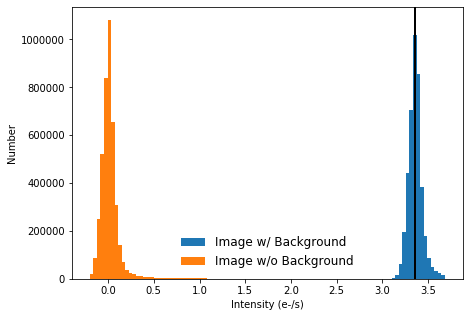

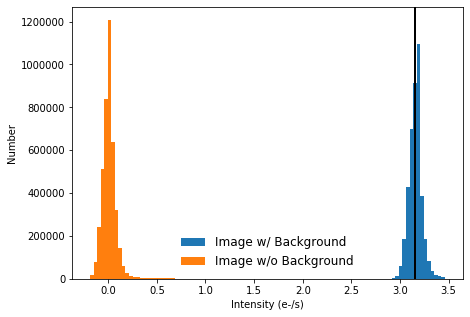

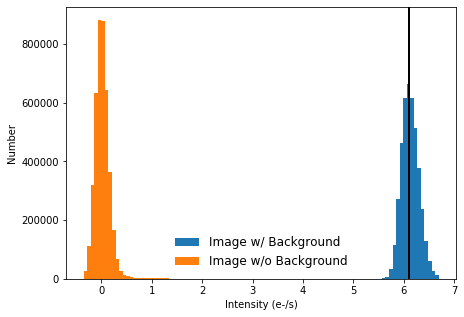

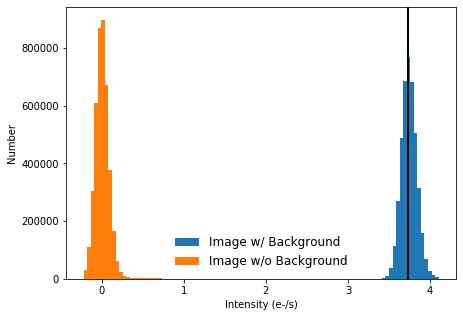

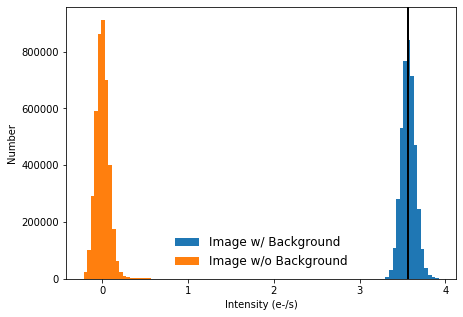

In [11]:
#***********
qa_background(img_ngc7128_V, img_ngc7128_V_nosky, bkg_ngc_V)
qa_background(img_ngc7128_B, img_ngc7128_B_nosky, bkg_ngc_B)
qa_background(img_Nova_R, img_Nova_R_nosky, bkg_Nova_R)
qa_background(img_Nova_V, img_Nova_V_nosky, bkg_Nova_V)
qa_background(img_Nova_B, img_Nova_B_nosky, bkg_Nova_B)

This routine detects stars in the image.  It requires a zero background image.  There are many ways to measure object flux.  We are using the DAOStarfinder algorithm described (https://photutils.readthedocs.io/en/stable/api/photutils.detection.DAOStarFinder.html)

This code requires as input the FWHM of stars in the image in pixel units.  You can determine this using the *imexam* task.

You can use this by going to your image directory and typing *ipython* at the command line.  Once the interactive python environment loads you type the following set of commands:

*import imexam*
*viewer=imexam.connect()*
*viewer.load_fits('<filename>')*
*viewer.scale()*
    
You can then hit the "a" key and "r" key on bright isolated and unsaturated stars to find the FWHM.

If imexam doesn't work on your computer then just use the mean FWHM from all the individual observations for that band/target

This will need to be run once for each band

In [36]:
#this code outputs a file with all the detected stars.
#fwhm is for stars in the image in units of pixels
#nsigma is the detection threshold for each star
def find_stars(image, imgfile, fwhm, nsigma=3, sigma=None, 
               verbose=True, overwrite=False):
    from astropy.table import Table
    
    #this makes a file 
    starsfile = os.path.join(flatpath, 'stars-{}'.format(os.path.basename(imgfile)))
    if not os.path.isfile(starsfile) or overwrite:
        from photutils import DAOStarFinder
        if sigma is None:
            sigma = np.std(image)

        daofind = DAOStarFinder(fwhm=fwhm, threshold=nsigma * sigma)
        srcs = daofind(image)
        # reverse-sort by flux 
        srcs.sort('flux')
        srcs.reverse()
        if verbose:
            print('Found {} sources'.format(len(srcs)))

        print('Writing {} stars to {}'.format(len(srcs), starsfile))
        srcs.write(starsfile, overwrite=True)
    else:
        srcs = Table.read(starsfile)
        print('Read {} stars from {}'.format(len(srcs), starsfile))
    return srcs

In [46]:
#***********
srcs_ngc7128_V = find_stars(img_ngc7128_V_nosky, imgfile_ngc7128_V, sigma=bkg_ngc_V.background_rms_median, nsigma=5, 
                  verbose=True, overwrite=False, fwhm = 5.135)
srcs_ngc7128_V

Read 1627 stars from /home/b739c775/RFSLAB/USER_DPT/b739c775/ASTR596/Data/Flatcorrected/stars-NGC7128V.fits


id,xcentroid,ycentroid,sharpness,roundness1,roundness2,npix,sky,peak,flux,mag
int64,float64,float64,float64,float64,float64,int64,float64,float64,float64,float64
198,866.9443729752703,348.5883342831342,0.37555048587757134,0.3119793878665554,-0.18215658216405484,25,0.0,1188.1843854657964,2149.635750812871,-8.330912190703227
629,1839.8287876282827,1002.1476020748818,0.3633668219242714,-0.035807459404993455,-0.27812878286850995,25,0.0,1165.3331942099053,2100.5085627598173,-8.305811140716637
372,169.74604899670493,607.0767177283094,0.3345123539995317,0.22538556103936938,-0.2712468356864911,25,0.0,1197.3014671285976,2084.5437020959293,-8.297527511164972
776,2015.3626042479748,1160.5639631829072,0.32738603716260767,0.22771982937625743,0.2146550068003394,25,0.0,1170.9616149372403,2071.7008814612695,-8.29081762706953
1214,1167.2046441768844,1524.824993027637,0.3199090733474092,0.06126789342143754,-0.2634589450526798,25,0.0,1171.8510108996888,1869.3802297008908,-8.179244113353478
1087,1237.3528369541639,1421.3007558704173,0.4547147232612355,0.07100041534393041,-0.24470604319261335,25,0.0,1188.8860640839728,1756.0848412856953,-8.111363735092823
772,2015.3024952980193,1159.8046927658413,0.4329410174951066,0.15011116534003838,-0.233354426170955,25,0.0,1116.0709116025218,1630.2676398590424,-8.030647270169908
1090,1262.4519567351274,1423.990550649604,0.4443298501405627,-0.02234002770533302,-0.26238783184780684,25,0.0,830.8629443699264,1603.6728241225326,-8.012789424253718
767,2015.257014160604,1159.515990980442,0.44999913288694,-0.3849372623460227,-0.4226696817535714,25,0.0,1171.8297490800558,1524.5491468561365,-7.9578535731709845


In [47]:
srcs_ngc7128_B = find_stars(img_ngc7128_B_nosky, imgfile_ngc7128_B, sigma=bkg_ngc_B.background_rms_median, nsigma=5, 
                  verbose=True, overwrite=False, fwhm = 3.845)
srcs_ngc7128_B

Read 649 stars from /home/b739c775/RFSLAB/USER_DPT/b739c775/ASTR596/Data/Flatcorrected/stars-NGC7128B.fits


id,xcentroid,ycentroid,sharpness,roundness1,roundness2,npix,sky,peak,flux,mag
int64,float64,float64,float64,float64,float64,int64,float64,float64,float64,float64
485,710.1512095845098,1493.8641701291822,0.42836581671185703,0.04361627986933965,-0.3373065470139995,25,0.0,904.9375280243981,1347.2797192251655,-7.82364443085227
66,538.8422012604146,335.4571678350165,0.4410890252844623,0.12707700859617604,-0.29951464072001305,25,0.0,732.8537271269126,1059.8187691322314,-7.563079016239744
492,838.3407508093928,1512.0645620302032,0.4226894069123058,-0.06681148082730251,-0.3200985061528171,25,0.0,579.9277774362448,869.3114950832731,-7.347938556069234
226,1511.4624292964331,989.6255733579085,0.4500396811836852,-0.1920698645439162,-0.40839398934483234,25,0.0,544.8462793283323,770.5167440257086,-7.216955201922136
290,1686.9124394783585,1147.2642588903616,0.4060773465599096,-0.21424022472847973,-0.45464433508290364,25,0.0,505.37175181508775,643.4168464537587,-7.021231069399512
440,933.7277490603705,1411.272125474921,0.43638087318154806,-0.06798093087966751,-0.31650304684370517,25,0.0,297.0637419137698,450.12825204774157,-6.633340680109905
379,900.7076117449732,1304.7005019782928,0.4451603411939453,-0.23173212842253085,-0.4023112064615882,25,0.0,293.7284665941216,447.9615548779037,-6.628101858539842
434,730.4709567774116,1398.4906275459148,0.45674831879480426,-0.1342286047817311,-0.3790463082625272,25,0.0,281.64869769956516,423.7831020228892,-6.5678590890272845
355,361.03513919242096,1267.0708731136656,0.4125645208355974,-0.04832329835868757,-0.306473861775783,25,0.0,251.66927167341842,389.227685222439,-6.475509308639531


In [48]:
srcs_Nova_R = find_stars(img_Nova_R_nosky, imgfile_Nova_R, sigma=bkg_Nova_R.background_rms_median, nsigma=5, 
                  verbose=True, overwrite=False, fwhm = 5.405)
srcs_Nova_R

Read 318 stars from /home/b739c775/RFSLAB/USER_DPT/b739c775/ASTR596/Data/Flatcorrected/stars-NovaR.fits


id,xcentroid,ycentroid,sharpness,roundness1,roundness2,npix,sky,peak,flux,mag
int64,float64,float64,float64,float64,float64,int64,float64,float64,float64,float64
20,1743.7784418778078,188.27678142832062,0.26947258485689884,0.024210685661293797,0.6835846005494798,25,0.0,468.22026995148576,706.3703933713948,-7.122581220106925
297,581.9478297090787,1854.2277093481603,0.360786051638628,0.4038247365920032,0.810413816512853,25,0.0,456.49026644702036,697.5999250295292,-7.109016063128136
183,556.2248260598958,1258.9872789299181,0.35602430263150303,0.030214186757956677,0.7109439067997566,25,0.0,458.6247103207188,652.4813659921007,-7.036420283273448
14,1743.9063068684784,180.7781136810237,0.33178361418288654,-0.08428996601291555,0.3474395435224588,25,0.0,467.14012380365017,584.8879073673879,-6.917681605904864
287,582.2488138225527,1843.4786512853473,0.42913664407113633,0.2647663296357107,0.7364756009250751,25,0.0,469.4516314767765,567.7411391702049,-6.885375912097267
196,197.88600006460024,1316.6070869220716,0.2528101779788989,0.195963230701946,0.5860314461319348,25,0.0,462.2424780821016,548.7369197527676,-6.848410452729547
143,1775.3791294800467,1076.4326734599522,0.5200637388550502,-0.07855432163278148,0.9611242149430487,25,0.0,455.9832222086204,519.9971106527444,-6.790002326245385
193,197.57541360545525,1308.485094912922,0.5306456425938032,0.18008694389171148,0.3953750689658345,25,0.0,456.6450703732198,409.3607784696916,-6.530265574625622
177,251.4727824895886,1253.5340621477387,0.5000816805181576,-0.11260096106688534,0.20405583509031627,25,0.0,433.288595168246,392.09997015875945,-6.4834920231192585


In [49]:
srcs_Nova_V = find_stars(img_Nova_V_nosky, imgfile_Nova_V, sigma=bkg_Nova_V.background_rms_median, nsigma=5, 
                  verbose=True, overwrite=False, fwhm = 6.258)
srcs_Nova_V

Read 277 stars from /home/b739c775/RFSLAB/USER_DPT/b739c775/ASTR596/Data/Flatcorrected/stars-NovaV.fits


id,xcentroid,ycentroid,sharpness,roundness1,roundness2,npix,sky,peak,flux,mag
int64,float64,float64,float64,float64,float64,int64,float64,float64,float64,float64
13,1750.4046154006785,176.8106489994729,0.36372381621737865,0.2984374228007878,-0.25021100491402776,25,0.0,484.8898225707201,540.6560804125487,-6.8323027289640965
246,2016.2138483092351,1808.1533278312652,0.4047614069769546,-0.21319120750363507,-0.25115404016359755,25,0.0,331.19135578771943,385.54913542842064,-6.465199333954505
254,588.7530362091911,1839.5559375428068,0.4936506290528056,-0.3962148722151585,-0.6687281580136977,25,0.0,454.5482542218171,357.02566211879105,-6.381748583109901
253,589.016647184264,1839.2286744076212,0.4631523049361222,0.14662807611332232,-0.10440303636682087,25,0.0,439.0103393051785,352.70370826418156,-6.368525064466465
123,1781.9295003372865,1063.5764228659239,0.4012401334923081,0.030961011556978876,-0.1558481333046133,25,0.0,398.66267632456646,351.40601019694816,-6.364522962712136
252,588.1493023254803,1839.1386063412165,0.38559762972406936,0.21750811158227468,0.3356257665460252,25,0.0,460.0125223230903,344.1329796065897,-6.341815736876558
150,562.3609688333427,1244.2938385793018,0.44758851152443435,0.09523847567090991,0.2919704897225134,25,0.0,453.68270658576824,334.14342988687014,-6.309832315512741
153,257.934714864079,1249.389800671156,0.4554367855971944,0.013078939931489933,0.14506966769168275,25,0.0,431.054222355094,330.87768914564026,-6.299168709924374
166,204.36912106893112,1303.1790470572016,0.44418755110380276,-0.4841180262166359,-0.5507827001776453,25,0.0,461.42068640038684,330.5286133816329,-6.298022654227812


In [50]:
srcs_Nova_B = find_stars(img_Nova_B_nosky, imgfile_Nova_B, sigma=bkg_Nova_B.background_rms_median, nsigma=5, 
                  verbose=True, overwrite=False, fwhm = 6.245)
srcs_Nova_B

Read 178 stars from /home/b739c775/RFSLAB/USER_DPT/b739c775/ASTR596/Data/Flatcorrected/stars-NovaB.fits


id,xcentroid,ycentroid,sharpness,roundness1,roundness2,npix,sky,peak,flux,mag
int64,float64,float64,float64,float64,float64,int64,float64,float64,float64,float64
9,1756.6226223555964,168.70496795514774,0.5834145107607063,0.13272301863244665,0.01860352780737507,25,0.0,477.68009956851404,574.6564653491538,-6.89852074307443
7,1755.5228852589894,167.97688001145966,0.4770475997880135,0.3732030293605509,0.6632563977300205,25,0.0,469.4359984847974,398.32876352715255,-6.5006041704301145
5,1756.331218300857,165.38902533489824,0.5199249047416671,-0.2978702156240465,-0.16850530713691977,25,0.0,432.9565385114132,391.354093390077,-6.481424701767841
6,1756.6738240196705,167.37991072493082,0.5195898836204348,0.9195875649289749,-0.14936662286329813,25,0.0,466.77752474022407,367.46382840223674,-6.413036488493017
8,1756.972526353313,168.27080592030262,0.5251583702781282,-0.2981142905880138,0.20455188515258543,25,0.0,450.8395132710655,337.24502897608113,-6.319863892122505
114,210.56096111594277,1296.6099213355722,0.39093030660791844,0.08218382918567843,0.18332910991387613,25,0.0,397.2438668164956,330.70450259755887,-6.2986002698663714
164,594.7927434198809,1832.0717674548787,0.4013166748980832,0.10543090605683367,0.10832054684406836,25,0.0,335.38994168911023,315.7028388091463,-6.2481962177460995
156,2022.4069173919877,1801.0852300243744,0.4065239850240528,-0.17616016313834265,-0.016181566416673336,25,0.0,223.32324329326062,252.5520435075013,-6.005877217316337
106,264.2288632856437,1242.4447854742969,0.4208474621920257,-0.005927164062100555,0.11825016196632272,25,0.0,289.13998438152794,238.915940191467,-5.945612815838183


In [103]:
for i in range(len(srcs_Nova_B)):
    if 1113 < srcs_Nova_B[i][1] <1147:
        if 1005 < srcs_Nova_B[i][2] < 1045:
            print(i)
for i in range(len(srcs_Nova_V)):
    if 1113 < srcs_Nova_V[i][1] <1147:
        if 1005 < srcs_Nova_V[i][2] < 1045:
            print(i)

162
273


<h3> Use stars from Pan-STARRS</h3>

We will be using the large survey called Pan-STARRS (https://panstarrs.stsci.edu/).  Pan-STARRS uses SDSS filters (*griz*), which are different from the "Johnson" *BVR* filters that we are using.  But there are transformation between these filters such that if we know the Pan-STARRS magnitudes of a given object, we can determine its B-V color.

This routine sends a request to a catalog server at a remote location and pulls back all the photometry

In [51]:
def get_panstarrs_catalog(imgwcs, radius=0.2, rfaint=17, region=False):
    from astroquery.mast import Catalogs
    ra0, dec0 = imgwcs.wcs.crval
    print('Querying Pan-STARRS catalog with radius={:.3f} deg and central coordinates RA,Dec={:.5f},{:.5f}'.format(
        radius, ra0, dec0))
    if region:
        allcat = Catalogs.query_region('{} {}'.format(ra0, dec0), radius=radius,
                                       catalog='PANSTARRS', data_release='dr2', 
                                       table='mean')#, rMeanPSFMag=[12, 22])
    else:
        allcat = Catalogs.query_criteria(coordinates='{} {}'.format(ra0, dec0), radius=radius,
                                         catalog='PANSTARRS', data_release='dr2', 
                                         table='mean',
                                         columns=['objID', 'raMean', 'decMean',
                                                  'gMeanPSFMag', 'rMeanPSFMag', 'iMeanPSFMag', 'zMeanPSFMag'],
                                         gMeanPSFMag=[('lte', 18), ('gte', 12)],
                                         rMeanPSFMag=[('lte', 18), ('gte', 12)],
                                         iMeanPSFMag=[('lte', 18), ('gte', 12)],
                                         zMeanPSFMag=[('lte', 18), ('gte', 12)],
                                         sort_by=[("asc", "rMeanPSFMag")])
    

    #we limit ourselves to bright objects so that we know that they will have high Signal-to-Noise
    rmag = allcat['rMeanPSFMag']
    good = np.isfinite(rmag) * rmag < rfaint
    cat = allcat[good]
    print('Keeping {}/{} Pan-STARRS sources with rmag< {}.'.format(len(cat), len(allcat),rfaint))
    
    #make B and V-band magnitudes using the transformations published in Tonry et al. (2012)
    #https://ui.adsabs.harvard.edu/abs/2012ApJ...750...99T/abstract
    cat['B'] = 0.213 + 0.587 * (cat['gMeanPSFMag'] - cat['rMeanPSFMag']) + cat['gMeanPSFMag'] 
    cat['V'] = 0.006 + 0.474 *  (cat['gMeanPSFMag'] - cat['rMeanPSFMag']) + cat['rMeanPSFMag'] 
    
    return cat

In [52]:
%time refcat_ngc7128_V = get_panstarrs_catalog(imgwcs_ngc7128_V, radius=0.2)
refcat_ngc7128_V

Querying Pan-STARRS catalog with radius=0.200 deg and central coordinates RA,Dec=326.02067,53.75146
Keeping 889/918 Pan-STARRS sources with rmag< 17.
CPU times: user 27.7 ms, sys: 4.27 ms, total: 32 ms
Wall time: 3.36 s


objID,raMean,decMean,gMeanPSFMag,rMeanPSFMag,iMeanPSFMag,zMeanPSFMag,B,V
int64,float64,float64,float64,float64,float64,float64,float64,float64
172473260768521639,326.07689699,53.72576179,12.62600040435791,12.357000350952148,12.225000381469727,12.104000091552734,12.996903435707093,12.49050637626648
172353260800752122,326.08018881,53.6261404,12.89900016784668,12.418000221252441,12.175000190734863,12.008000373840332,13.394347136497498,12.65199419593811
172503258801023374,325.88018571,53.75214275,12.98900032043457,12.449000358581543,12.175000190734863,12.00100040435791,13.518980298042298,12.710960340499877
172493261417666169,326.14181906,53.74626654,12.76200008392334,12.50100040435791,12.41100025177002,12.37600040435791,13.128206895828248,12.630714252471924
172283259963169350,325.99613641,53.57397055,12.523200035095215,12.515899658203125,15.077400207519531,12.579099655151367,12.740485356330872,12.525360036849976
172553259686507433,325.96868718,53.79724702,12.994000434875488,12.564000129699707,12.359000205993652,12.22700023651123,13.459410614013672,12.773820274353028
172643260773104920,326.07735979,53.8701416,12.972000122070312,12.564000129699707,12.312000274658203,12.13700008392334,13.424496117591858,12.763392126083374
172473259798384953,325.97983039,53.7285263,12.942000389099121,12.62600040435791,12.479000091552734,12.37600040435791,13.340492380142212,12.781784397125245
172633258688450529,325.86897433,53.85810969,13.112000465393066,12.708000183105469,12.503000259399414,12.350000381469727,13.562148631095885,12.90549631690979


In [53]:
%time refcat_ngc7128_B = get_panstarrs_catalog(imgwcs_ngc7128_B, radius=0.2)
refcat_ngc7128_B

Querying Pan-STARRS catalog with radius=0.200 deg and central coordinates RA,Dec=326.00711,53.81114
Keeping 851/874 Pan-STARRS sources with rmag< 17.
CPU times: user 29.1 ms, sys: 350 µs, total: 29.5 ms
Wall time: 4.65 s


objID,raMean,decMean,gMeanPSFMag,rMeanPSFMag,iMeanPSFMag,zMeanPSFMag,B,V
int64,float64,float64,float64,float64,float64,float64,float64,float64
172473260768521639,326.07689699,53.72576179,12.62600040435791,12.357000350952148,12.225000381469727,12.104000091552734,12.996903435707093,12.49050637626648
172353260800752122,326.08018881,53.6261404,12.89900016784668,12.418000221252441,12.175000190734863,12.008000373840332,13.394347136497498,12.65199419593811
172503258801023374,325.88018571,53.75214275,12.98900032043457,12.449000358581543,12.175000190734863,12.00100040435791,13.518980298042298,12.710960340499877
172493261417666169,326.14181906,53.74626654,12.76200008392334,12.50100040435791,12.41100025177002,12.37600040435791,13.128206895828248,12.630714252471924
172643260773104920,326.07735979,53.8701416,12.972000122070312,12.564000129699707,12.312000274658203,12.13700008392334,13.424496117591858,12.763392126083374
172553259686507433,325.96868718,53.79724702,12.994000434875488,12.564000129699707,12.359000205993652,12.22700023651123,13.459410614013672,12.773820274353028
172473259798384953,325.97983039,53.7285263,12.942000389099121,12.62600040435791,12.479000091552734,12.37600040435791,13.340492380142212,12.781784397125245
172633258688450529,325.86897433,53.85810969,13.112000465393066,12.708000183105469,12.503000259399414,12.350000381469727,13.562148631095885,12.90549631690979
172743259826877794,325.98279481,53.95584406,13.439000129699707,12.814000129699707,12.519000053405762,12.347000122070312,14.018875129699707,13.116250129699708


In [54]:
%time refcat_Nova_R = get_panstarrs_catalog(imgwcs_Nova_R, radius=0.2)
refcat_Nova_R

Querying Pan-STARRS catalog with radius=0.200 deg and central coordinates RA,Dec=11.38218,41.90451
Keeping 264/332 Pan-STARRS sources with rmag< 17.
CPU times: user 20.4 ms, sys: 302 µs, total: 20.7 ms
Wall time: 26.9 s


objID,raMean,decMean,gMeanPSFMag,rMeanPSFMag,iMeanPSFMag,zMeanPSFMag,B,V
int64,float64,float64,float64,float64,float64,float64,float64,float64
158230116346469361,11.63463808,41.86560094,12.446000099182129,12.178000450134277,12.123000144958496,12.142000198364258,12.816315893173218,12.311032283782959
158190112505370928,11.25054054,41.82523147,12.878000259399414,12.517000198364258,12.36400032043457,12.284000396728516,13.302907295227051,12.694114227294921
158420111842767400,11.184552,42.022228,12.760000228881836,12.541000366210938,12.51200008392334,12.545000076293945,13.101553148269653,12.650806301116944
158090112615613324,11.26158965,41.74392184,13.405400276184082,12.645000457763672,12.244000434875488,12.005000114440918,14.064754969596862,13.011429971694946
158170112257638375,11.22570264,41.81476915,13.394000053405762,12.718000411987305,12.47700023651123,12.36400032043457,14.003811842918395,13.044424242019653
158490112615511786,11.26160066,42.07599417,13.112000465393066,12.8100004196167,12.737000465393066,12.73900032043457,13.502274492263794,12.959148441314698
158210115042413714,11.50424847,41.84423044,13.518899917602539,12.892000198364258,12.508000373840332,12.277000427246094,14.09989005279541,13.195150665283203
158070113119041568,11.31192454,41.72578213,13.258000373840332,12.892000198364258,12.663000106811523,12.51200008392334,13.685842476844787,13.071484281539917
158460112728996510,11.27293783,42.05493559,13.295000076293945,12.920000076293945,12.77400016784668,12.71500015258789,13.728125076293946,13.103750076293945


In [55]:
%time refcat_Nova_V = get_panstarrs_catalog(imgwcs_Nova_V, radius=0.2)
refcat_Nova_V

Querying Pan-STARRS catalog with radius=0.200 deg and central coordinates RA,Dec=11.38307,41.90364
Keeping 264/332 Pan-STARRS sources with rmag< 17.
CPU times: user 15.9 ms, sys: 8.3 ms, total: 24.2 ms
Wall time: 8.64 s


objID,raMean,decMean,gMeanPSFMag,rMeanPSFMag,iMeanPSFMag,zMeanPSFMag,B,V
int64,float64,float64,float64,float64,float64,float64,float64,float64
158230116346469361,11.63463808,41.86560094,12.446000099182129,12.178000450134277,12.123000144958496,12.142000198364258,12.816315893173218,12.311032283782959
158190112505370928,11.25054054,41.82523147,12.878000259399414,12.517000198364258,12.36400032043457,12.284000396728516,13.302907295227051,12.694114227294921
158420111842767400,11.184552,42.022228,12.760000228881836,12.541000366210938,12.51200008392334,12.545000076293945,13.101553148269653,12.650806301116944
158090112615613324,11.26158965,41.74392184,13.405400276184082,12.645000457763672,12.244000434875488,12.005000114440918,14.064754969596862,13.011429971694946
158170112257638375,11.22570264,41.81476915,13.394000053405762,12.718000411987305,12.47700023651123,12.36400032043457,14.003811842918395,13.044424242019653
158490112615511786,11.26160066,42.07599417,13.112000465393066,12.8100004196167,12.737000465393066,12.73900032043457,13.502274492263794,12.959148441314698
158070113119041568,11.31192454,41.72578213,13.258000373840332,12.892000198364258,12.663000106811523,12.51200008392334,13.685842476844787,13.071484281539917
158210115042413714,11.50424847,41.84423044,13.518899917602539,12.892000198364258,12.508000373840332,12.277000427246094,14.09989005279541,13.195150665283203
158460112728996510,11.27293783,42.05493559,13.295000076293945,12.920000076293945,12.77400016784668,12.71500015258789,13.728125076293946,13.103750076293945


In [78]:
%time refcat_Nova_B = get_panstarrs_catalog(imgwcs_Nova_B, radius=0.2)
refcat_Nova_B



Querying Pan-STARRS catalog with radius=0.200 deg and central coordinates RA,Dec=11.38390,41.90295
Keeping 263/331 Pan-STARRS sources with rmag< 17.
CPU times: user 22.8 ms, sys: 213 µs, total: 23 ms
Wall time: 8.49 s


objID,raMean,decMean,gMeanPSFMag,rMeanPSFMag,iMeanPSFMag,zMeanPSFMag,B,V
int64,float64,float64,float64,float64,float64,float64,float64,float64
158230116346469361,11.63463808,41.86560094,12.446000099182129,12.178000450134277,12.123000144958496,12.142000198364258,12.816315893173218,12.311032283782959
158190112505370928,11.25054054,41.82523147,12.878000259399414,12.517000198364258,12.36400032043457,12.284000396728516,13.302907295227051,12.694114227294921
158420111842767400,11.184552,42.022228,12.760000228881836,12.541000366210938,12.51200008392334,12.545000076293945,13.101553148269653,12.650806301116944
158090112615613324,11.26158965,41.74392184,13.405400276184082,12.645000457763672,12.244000434875488,12.005000114440918,14.064754969596862,13.011429971694946
158170112257638375,11.22570264,41.81476915,13.394000053405762,12.718000411987305,12.47700023651123,12.36400032043457,14.003811842918395,13.044424242019653
158490112615511786,11.26160066,42.07599417,13.112000465393066,12.8100004196167,12.737000465393066,12.73900032043457,13.502274492263794,12.959148441314698
158070113119041568,11.31192454,41.72578213,13.258000373840332,12.892000198364258,12.663000106811523,12.51200008392334,13.685842476844787,13.071484281539917
158210115042413714,11.50424847,41.84423044,13.518899917602539,12.892000198364258,12.508000373840332,12.277000427246094,14.09989005279541,13.195150665283203
158460112728996510,11.27293783,42.05493559,13.295000076293945,12.920000076293945,12.77400016784668,12.71500015258789,13.728125076293946,13.103750076293945


We need to match the Pan-STARRS catalog against ours.  First we need to compute the nearest Pan-STARRS star to each of ours and look at the distribution of distances to find the optimal match.

In [57]:
def sep_check(imgwcs,srcs,refcat):
    import astropy.units as u
    from astropy.coordinates import SkyCoord
    #this makes an instance of a SkyCoord class containing the RAs and Decs from Pan-STARRS objects
    refcoord = SkyCoord(ra=refcat['raMean']*u.deg, dec=refcat['decMean']*u.deg)
    #This uses the WCS to convert the x and y positions of stars in our image to RA-DEC
    radec_stars = imgwcs.all_pix2world(srcs['xcentroid']+1, srcs['ycentroid']+1, 1)
    #this does the same from our targets 
    coord = SkyCoord(ra=radec_stars[0]*u.deg, dec=radec_stars[1]*u.deg)

    #this calculates the separations.  The "_" are values that are thrown away
    _, sep2d, _ = coord.match_to_catalog_sky(refcoord)

    #plot the histograms
    _ = plt.hist(sep2d.arcsec, bins=100, range=(-0.5, 3))
    return refcoord, coord

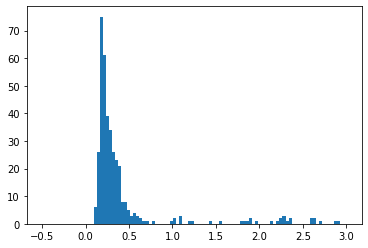

In [58]:
refcoord_ngc7128_V, coord_ngc7128_V = sep_check(imgwcs_ngc7128_V,srcs_ngc7128_V,refcat_ngc7128_V)

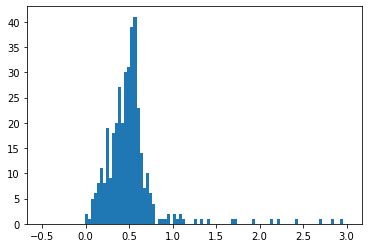

In [59]:
refcoord_ngc7128_B, coord_ngc7128_B = sep_check(imgwcs_ngc7128_B,srcs_ngc7128_B,refcat_ngc7128_B)

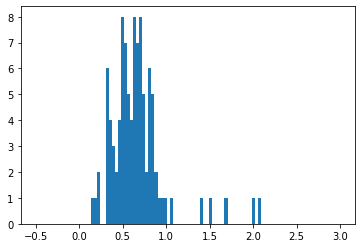

In [60]:
refcoord_Nova_R, coord_Nova_R = sep_check(imgwcs_Nova_R,srcs_Nova_R,refcat_Nova_R)

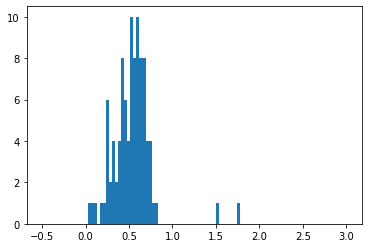

In [61]:
refcoord_Nova_V, coord_Nova_V = sep_check(imgwcs_Nova_V,srcs_Nova_V,refcat_Nova_V)

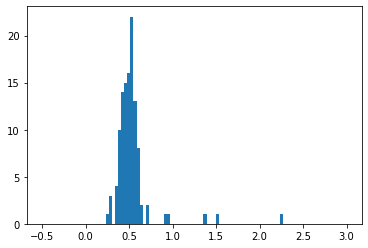

In [62]:
refcoord_Nova_B, coord_Nova_B = sep_check(imgwcs_Nova_B,srcs_Nova_B,refcat_Nova_B)

It looks like the optimal match is less than 1.0 arcsec.  The following routine matches to within this tolerance

In [63]:
from astropy import units as u
#take two lists of coordinates 
def match_src_ref(refcoord, coord, srcs, img, radasec = 1.0):
    rad = radasec*u.arcsec

    #find the indices of the reference and source list that correspond to matching objects such that
    #the first index in each list corresponds to the first matching object
    indx_ref, indx, d2d, _ = coord.search_around_sky(refcoord, rad)
    nmatch = len(indx_ref)
    print('Found {}/{} stars within {}'.format(nmatch, len(srcs), rad))
    display_image(img, srcs=srcs[indx], calibrated=True)
    return indx, indx_ref

Found 92/318 stars within 1.0 arcsec
Found 95/277 stars within 1.0 arcsec
Found 112/178 stars within 1.0 arcsec
Found 347/1627 stars within 1.0 arcsec
Found 364/649 stars within 1.0 arcsec


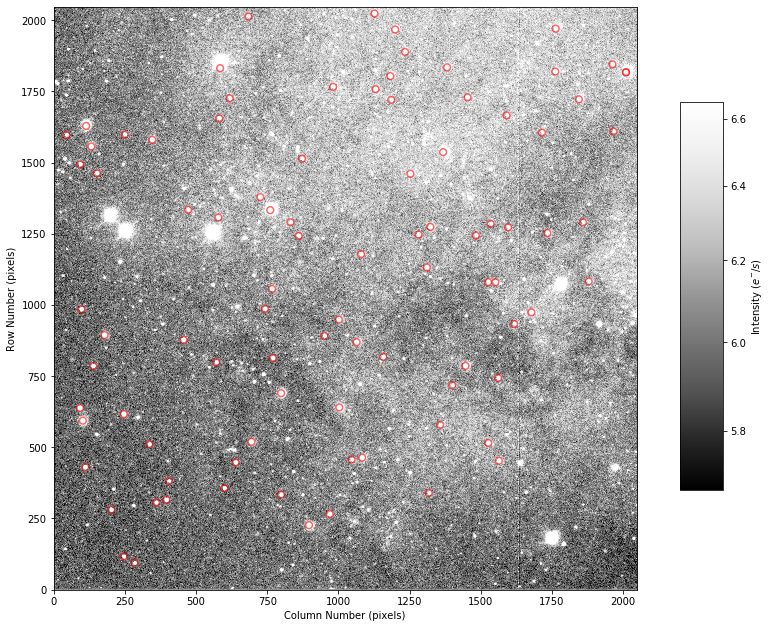

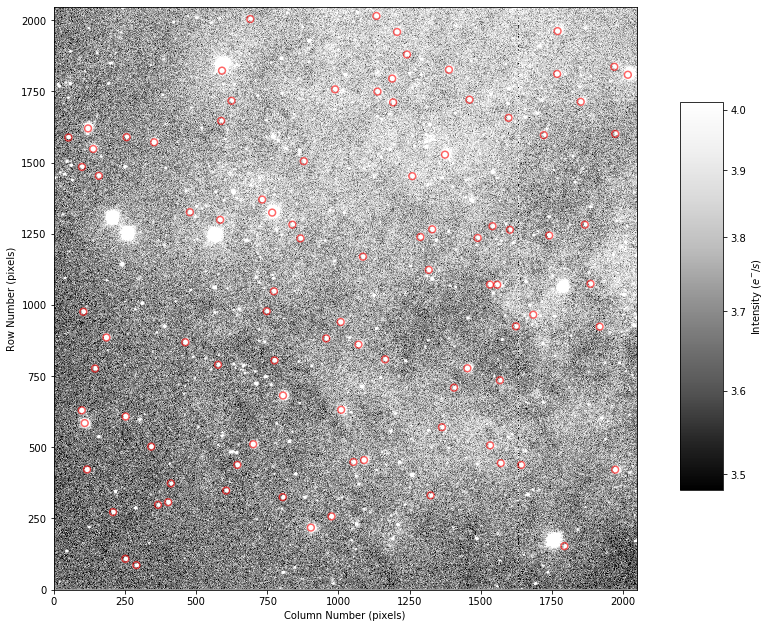

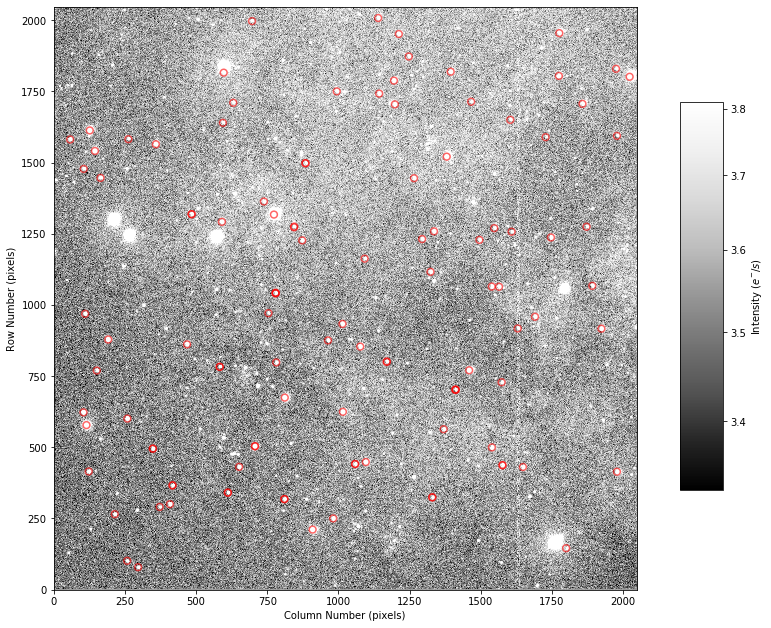

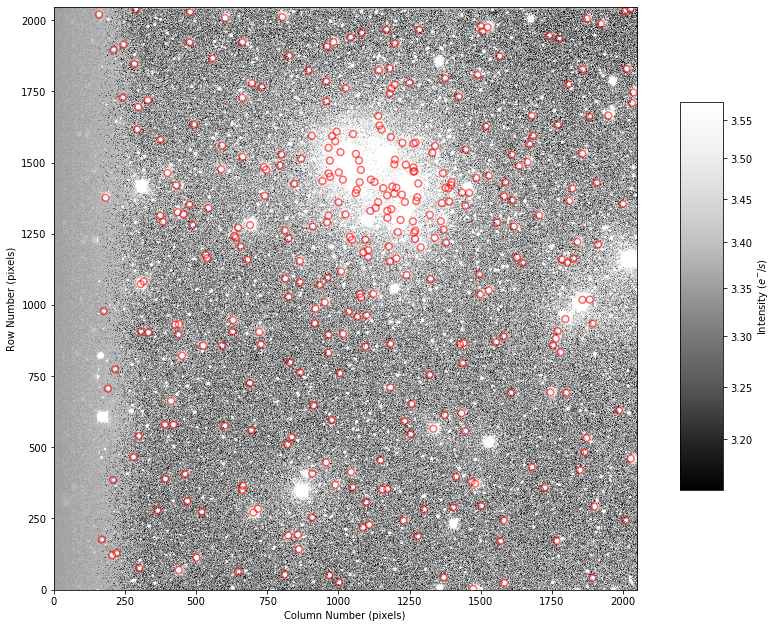

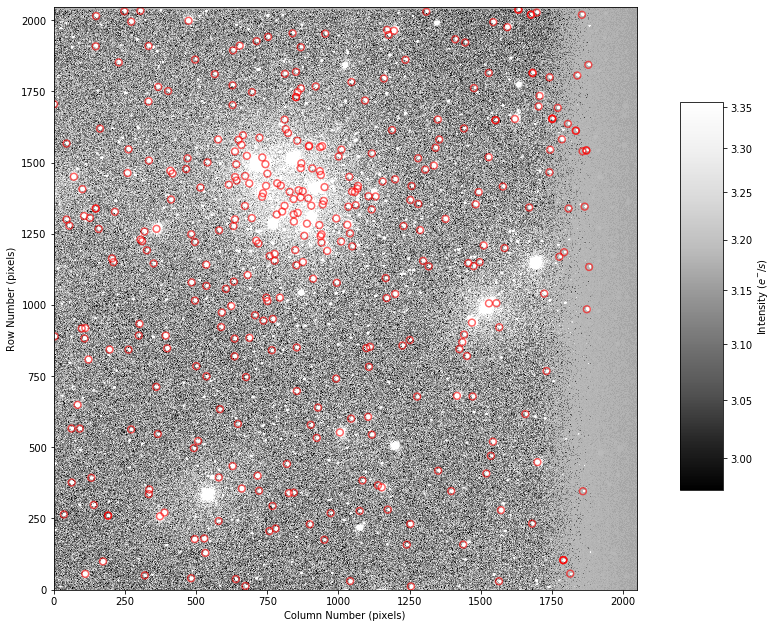

In [64]:
indx_Nova_R, indx_ref_Nova_R = match_src_ref(refcoord_Nova_R, coord_Nova_R, srcs_Nova_R, img_Nova_R)
indx_Nova_V, indx_ref_Nova_V = match_src_ref(refcoord_Nova_V, coord_Nova_V, srcs_Nova_V, img_Nova_V)
indx_Nova_B, indx_ref_Nova_B = match_src_ref(refcoord_Nova_B, coord_Nova_B, srcs_Nova_B, img_Nova_B)
indx_ngc7128_V, indx_ref_ngc7128_V = match_src_ref(refcoord_ngc7128_V, coord_ngc7128_V, srcs_ngc7128_V, img_ngc7128_V)
indx_ngc7128_B, indx_ref_ngc7128_B = match_src_ref(refcoord_ngc7128_B, coord_ngc7128_B, srcs_ngc7128_B, img_ngc7128_B)


Now let's calculate the zeropoints for each image.  To compare our objects to those from Pan-STARRS we will need to correct for the effects of airmass.

We start by specifying the atmospheric extinction coefficient for each object.  This says for a typical atmosphere, how much the magnitude changes for an increase in airmass of 1.  We could have measured this using mutliple standard stars but will just assume a cannonical value for now.

In [66]:
def zp_meas(srcs, refcat, indx, indx_ref, hdr):
    kext = {'B': 0.4, 'V': 0.2, 'R_JOHN' : 0.2}
    import numpy.ma as ma

    #this consists of the instrumental magnitude, which is the magnitude, including an airmass correction
    #but without a true zeropoint.  The second term says how the magnitude 
    #m(inst) = -2.5 * log(flux) - (sec z) * k
    instmag = srcs['mag'][indx].data - hdr['AIRMASS'] * kext[hdr['FILTER']]
    #the Pan-STARRS magnitudes for the same objects, as indicated using the indx_ref array
    print(indx_ref)
    psmag = refcat[hdr['FILTER']][indx_ref].data

    #calculate the median zeropoint defined as
    #psmag = -2.5 * log(flux) - (sec z) * k + ZP = m(inst) + ZP
    medzp = np.median(psmag - instmag)
    print(hdr['FILTER'],'zeropoint = ', medzp)
    print('Airmass in {} was {}'.format(hdr['FILTER'], hdr['AIRMASS']))
    return medzp

In [67]:
#ZPV = zp_meas(srcs_Nova_R,refcat_Nova_R, indx_Nova_R, indx_ref_Nova_R,hdr_Nova_R)
ZP_Nova_V = zp_meas(srcs_Nova_V,refcat_Nova_V, indx_Nova_V, indx_ref_Nova_V,hdr_Nova_V)
ZP_Nova_B = zp_meas(srcs_Nova_B,refcat_Nova_B, indx_Nova_B, indx_ref_Nova_B,hdr_Nova_B)
ZP_ngc7128_V = zp_meas(srcs_ngc7128_V,refcat_ngc7128_V, indx_ngc7128_V, indx_ref_ngc7128_V,hdr_ngc7128_V)
ZP_ngc7128_B = zp_meas(srcs_ngc7128_B,refcat_ngc7128_B, indx_ngc7128_B, indx_ref_ngc7128_B,hdr_ngc7128_B)

[  1   7   9  10  14  15  17  18  23  30  34  36  37  38  41  42  43  48
  54  56  58  59  62  63  65  66  72  74  75  82  83  89  93  95  97 100
 101 109 114 116 118 119 126 130 134 136 142 145 148 152 154 161 162 163
 166 168 169 172 173 178 179 180 183 189 191 195 197 198 200 202 206 207
 211 215 216 219 220 221 222 226 227 228 229 230 235 236 237 240 243 246
 249 251 254 255 259]
V zeropoint =  18.64839168793181
Airmass in V was 1.129516
[  1   7   9  10  14  15  17  18  23  30  34  36  36  37  38  41  42  43
  48  54  56  58  59  62  63  65  66  72  74  75  82  83  89  93  95  97
 100 101 108 113 115 117 118 125 125 125 129 133 135 141 144 147 151 153
 160 161 162 165 167 168 171 172 177 178 179 179 182 188 190 194 196 196
 197 199 199 201 201 205 205 206 210 214 215 215 218 218 219 220 221 225
 226 227 228 228 229 234 235 236 236 239 242 242 245 248 250 250 253 253
 254 254 254 258]
B zeropoint =  18.99253921086316
Airmass in B was 1.098645
[  0   2   3   5   7   9  14  16  19  2

/home/b739c775/.conda/envs/python3env/lib/python3.7/site-packages/numpy/core/fromnumeric.py:734: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


Now match the B and V-band catalogs together for this cluster, apply the zeropoints, and plot a CMD!

In [123]:
def make_CMD(img_B,imgwcs_B,srcs_B,imgwcs_V,srcs_V, hdr_B, hdr_V, ZPB, ZPV, radasec = 1.0):
    import astropy.units as u
    from astropy.coordinates import SkyCoord
    import numpy.ma as ma
    kext = {'B': 0.4, 'V': 0.2}
    rad = radasec * u.arcsec
    
    #This uses the WCS to convert the x and y positions of stars in our image to RA-DEC
    radec_stars_B = imgwcs_B.all_pix2world(srcs_B['xcentroid']+1, srcs_B['ycentroid']+1, 1)
    radec_stars_V = imgwcs_V.all_pix2world(srcs_V['xcentroid']+1, srcs_V['ycentroid']+1, 1)
    #this makes an instance of a SkyCoord class containing the RAs and Decs from the B-band
    coord_B = SkyCoord(ra=radec_stars_B[0]*u.deg, dec=radec_stars_B[1]*u.deg)
    coord_V = SkyCoord(ra=radec_stars_V[0]*u.deg, dec=radec_stars_V[1]*u.deg)

    #this calculates the separations.  The "_" are values that are thrown away
    _, sep2d, _ = coord_B.match_to_catalog_sky(coord_V)

    #plot the histograms
    _ = plt.hist(sep2d.arcsec, bins=100, range=(-0.5, 3))
    plt.xlabel('Sep between B and V sources [arcsec]',fontsize=14)
    plt.ylabel('N',fontsize=14)


    #find the indices of the reference and source list that correspond to matching objects such that
    #the first index in each list corresponds to the first matching object
    indx_B, indx_V, d2d, _ = coord_V.search_around_sky(coord_B, rad)
    nmatch = len(indx_B)
    print('Found {}/{} stars within {}'.format(nmatch, len(srcs_B), rad))
    display_image(img_B, srcs=srcs_B[indx_B], calibrated=True)
    display_image(img_Nova_V, srcs=srcs_V[273], calibrated=True)
    
    #make the B and V-band magnitudes
    magB = srcs_B['mag'][indx_B].data + ZPB - hdr_B['AIRMASS'] * kext[hdr_B['FILTER']]
    magV = srcs_V['mag'][indx_V].data + ZPV - hdr_V['AIRMASS'] * kext[hdr_V['FILTER']]
    novamagB = srcs_B['mag'][162].data + ZPB - hdr_B['AIRMASS'] * kext[hdr_B['FILTER']]
    novamagV = srcs_V['mag'][273].data + ZPB - hdr_B['AIRMASS'] * kext[hdr_B['FILTER']]
    #print(magB)
    #print(magV)
    #print(magB-magV)

    #plot the CMD!
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.plot(magB-magV, magV, 'ro',alpha=0.7)
    ax.scatter(novamagB-novamagV, novamagV, c='g', alpha=0.8)
    print(novamagB-novamagV)
    print(novamagV)
    ax.set_ylim(19,10)
    ax.set_xlabel('B-V',fontsize=18)
    ax.set_ylabel('V',fontsize=18)
    plt.show


Found 175/178 stars within 1.0 arcsec
-0.12347215142204249
18.543583424705883


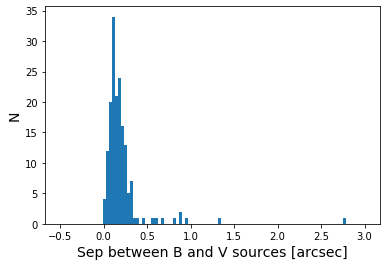

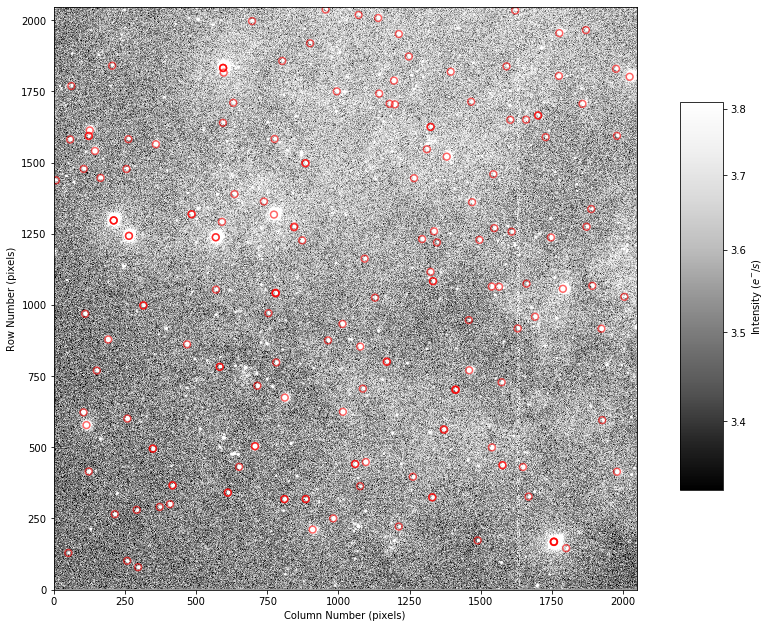

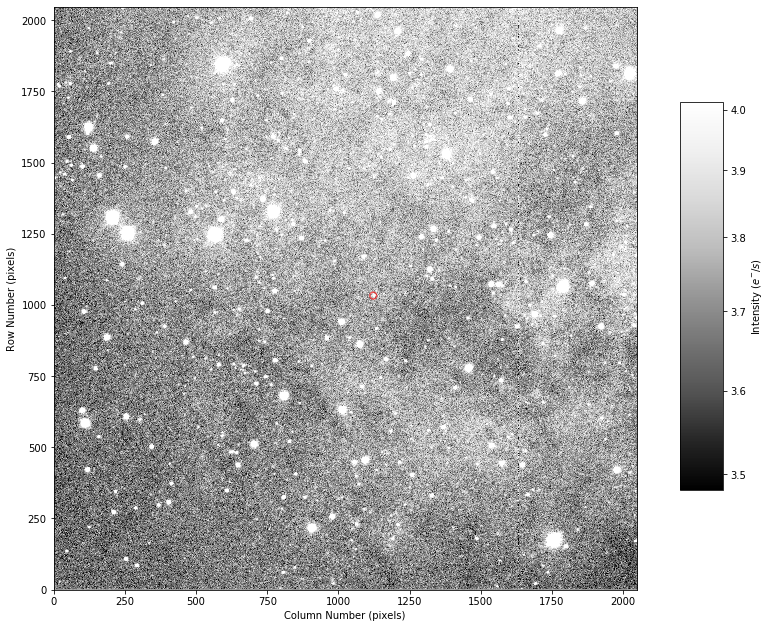

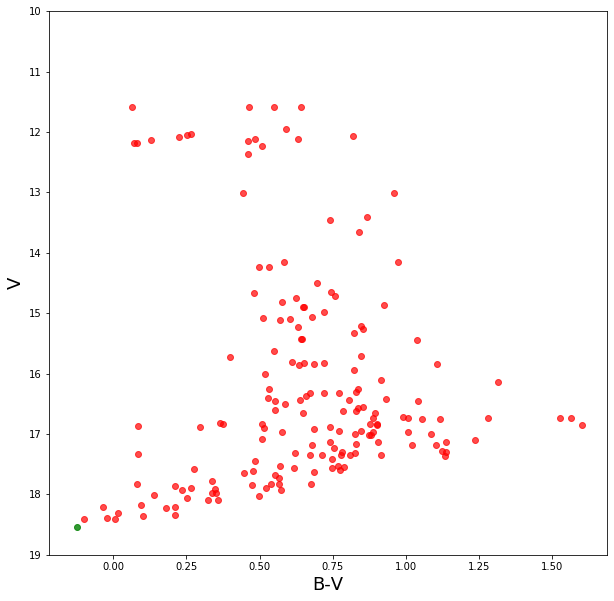

In [124]:
make_CMD(img_Nova_B, imgwcs_Nova_B, srcs_Nova_B,imgwcs_Nova_V, srcs_Nova_V, hdr_Nova_B, hdr_Nova_V, ZP_Nova_B, ZP_Nova_V, radasec = 1.0)

Found 603/649 stars within 1.0 arcsec


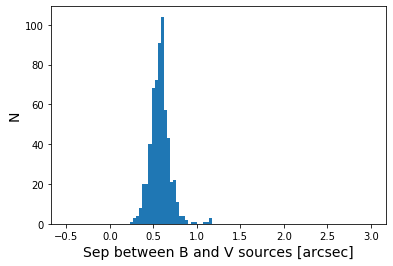

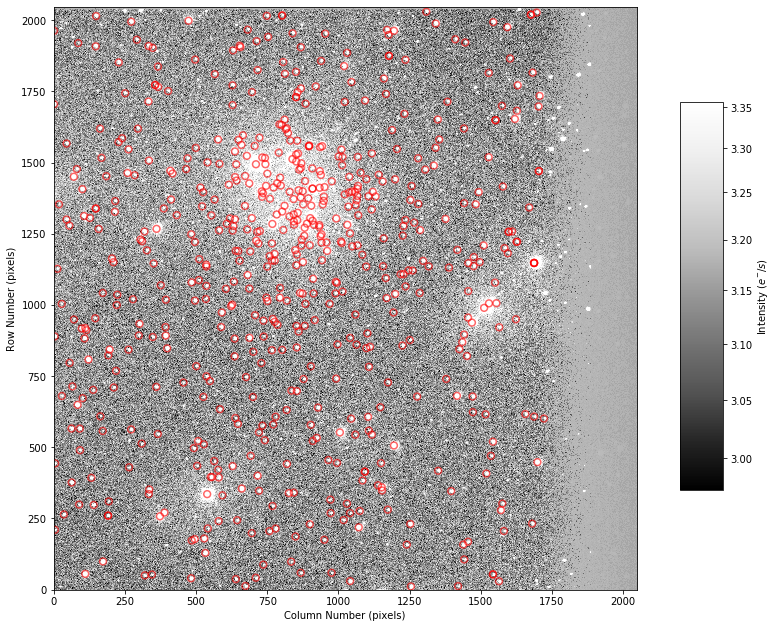

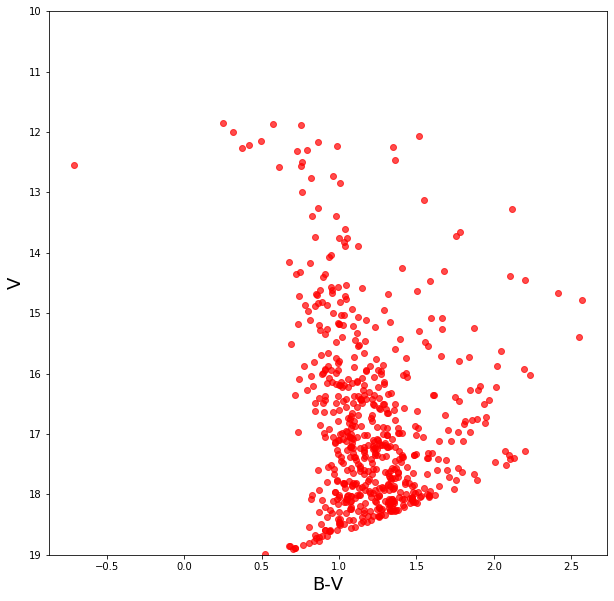

In [69]:
make_CMD(img_ngc7128_B, imgwcs_ngc7128_B, srcs_ngc7128_B,imgwcs_ngc7128_V, srcs_ngc7128_V, hdr_ngc7128_B, hdr_ngc7128_V, ZP_ngc7128_B, ZP_ngc7128_V, radasec = 1.0)